# PRODIGY INFOTECH
## DATA SCIENCE INTERNSHIP
### Name : Manoj Kanna.E
#### Task - 5 : US_Accident Dataset

## Importing Libraries

In [1]:
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

In [2]:
# Load and Reading The Dataset
file_path = '/kaggle/input/us-accidents/US_Accidents_March23.csv'
data = pd.read_csv(file_path)

In [3]:
# Listing Top 5 rows
data.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.01,...,False,False,False,False,True,False,Day,Day,Day,Day


In [4]:
# Listing Bottom 5 rows
data.tail()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
7728389,A-7777757,Source1,2,2019-08-23 18:03:25,2019-08-23 18:32:01,34.00248,-117.37936,33.99888,-117.37094,0.543,...,False,False,False,False,False,False,Day,Day,Day,Day
7728390,A-7777758,Source1,2,2019-08-23 19:11:30,2019-08-23 19:38:23,32.76696,-117.14806,32.76555,-117.15363,0.338,...,False,False,False,False,False,False,Day,Day,Day,Day
7728391,A-7777759,Source1,2,2019-08-23 19:00:21,2019-08-23 19:28:49,33.77545,-117.84779,33.77740,-117.85727,0.561,...,False,False,False,False,False,False,Day,Day,Day,Day
7728392,A-7777760,Source1,2,2019-08-23 19:00:21,2019-08-23 19:29:42,33.99246,-118.40302,33.98311,-118.39565,0.772,...,False,False,False,False,False,False,Day,Day,Day,Day
7728393,A-7777761,Source1,2,2019-08-23 18:52:06,2019-08-23 19:21:31,34.13393,-117.23092,34.13736,-117.23934,0.537,...,False,False,False,False,False,False,Day,Day,Day,Day


## Data Pre-processing

In [5]:
# Showing count of rows & columns
data.shape

(7728394, 46)

In [6]:
# printing the datatype of columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7728394 entries, 0 to 7728393
Data columns (total 46 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Source                 object 
 2   Severity               int64  
 3   Start_Time             object 
 4   End_Time               object 
 5   Start_Lat              float64
 6   Start_Lng              float64
 7   End_Lat                float64
 8   End_Lng                float64
 9   Distance(mi)           float64
 10  Description            object 
 11  Street                 object 
 12  City                   object 
 13  County                 object 
 14  State                  object 
 15  Zipcode                object 
 16  Country                object 
 17  Timezone               object 
 18  Airport_Code           object 
 19  Weather_Timestamp      object 
 20  Temperature(F)         float64
 21  Wind_Chill(F)          float64
 22  Humidity(%)       

In [7]:
# Displaying the columns name 
print(data.columns)

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Description',
       'Street', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')


In [8]:
# Finding Missing values
data.isnull().sum()

ID                             0
Source                         0
Severity                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Start_Lng                      0
End_Lat                  3402762
End_Lng                  3402762
Distance(mi)                   0
Description                    5
Street                     10869
City                         253
County                         0
State                          0
Zipcode                     1915
Country                        0
Timezone                    7808
Airport_Code               22635
Weather_Timestamp         120228
Temperature(F)            163853
Wind_Chill(F)            1999019
Humidity(%)               174144
Pressure(in)              140679
Visibility(mi)            177098
Wind_Direction            175206
Wind_Speed(mph)           571233
Precipitation(in)        2203586
Weather_Condition         173459
Amenity                        0
Bump      

###  Dropping Irrelevant Columns and Imputing Missing Values for Categorical Data

In [9]:
data.drop(columns=['End_Lat','End_Lng','Wind_Chill(F)','Precipitation(in)'],axis=1,inplace=True)
categorical=[i for i in data.columns if data[i].dtype=='O']

#for categorical values we can replace the null values with the Mode of it
for i in categorical:
    data[i].fillna(data[i].mode()[0],inplace=True)
data.drop(columns=['Wind_Speed(mph)', 'Visibility(mi)', 'Pressure(in)', 'Humidity(%)', 'Temperature(F)'], axis=1, inplace=True)

In [10]:
# Verifying The Missing values
data.isnull().sum()

ID                       0
Source                   0
Severity                 0
Start_Time               0
End_Time                 0
Start_Lat                0
Start_Lng                0
Distance(mi)             0
Description              0
Street                   0
City                     0
County                   0
State                    0
Zipcode                  0
Country                  0
Timezone                 0
Airport_Code             0
Weather_Timestamp        0
Wind_Direction           0
Weather_Condition        0
Amenity                  0
Bump                     0
Crossing                 0
Give_Way                 0
Junction                 0
No_Exit                  0
Railway                  0
Roundabout               0
Station                  0
Stop                     0
Traffic_Calming          0
Traffic_Signal           0
Turning_Loop             0
Sunrise_Sunset           0
Civil_Twilight           0
Nautical_Twilight        0
Astronomical_Twilight    0
d

In [11]:
# Basic Statistical Implimentations
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Severity,7728394.0,2.212384,0.487531,1.000000,2.000000,2.000000,2.000000,4.000000
Start_Lat,7728394.0,36.201195,5.076079,24.554800,33.399631,35.823974,40.084959,49.002201
Start_Lng,7728394.0,-94.702545,17.391756,-124.623833,-117.219396,-87.766616,-80.353676,-67.113167
Distance(mi),7728394.0,0.561842,1.776811,0.000000,0.000000,0.030000,0.464000,441.750000


In [12]:
# Checking for duplicate values
data.duplicated().sum()

0

## Data Visualization

### Accident Severity Distribution Across Different Times of Day

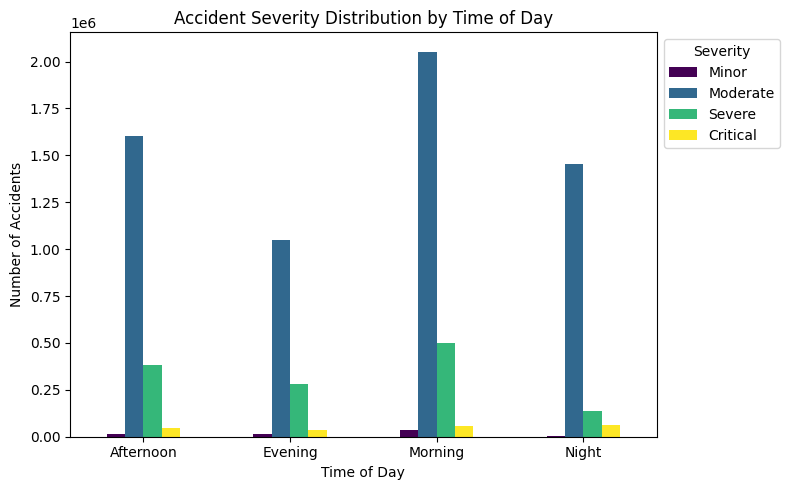

In [13]:
# Create bar plot for Time of Day and Severity Accidents 
data['Start_Time'] = pd.to_datetime(data['Start_Time'], errors='coerce')
def categorize_time_of_day(hour):
    if 5 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 17:
        return 'Afternoon'
    elif 17 <= hour < 21:
        return 'Evening'
    else:
        return 'Night'
data['Time_of_Day'] = data['Start_Time'].dt.hour.apply(categorize_time_of_day)
severity_by_time = data.groupby(['Time_of_Day', 'Severity']).size().unstack(fill_value=0)
severity_by_time = severity_by_time.rename(columns={1: "Minor", 2: "Moderate", 3: "Severe", 4: "Critical"})

# Plot the data
severity_by_time.plot(kind='bar', stacked=False, figsize=(8,5), colormap='viridis')
plt.title('Accident Severity Distribution by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=0)
plt.legend(title='Severity', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

### Tracking Hourly Trends of Accidents Frequency

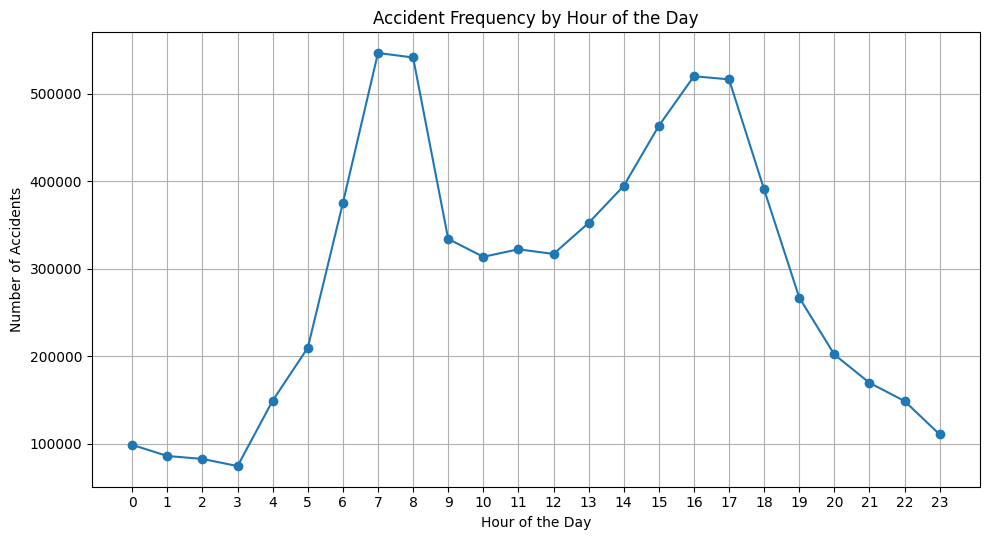

In [14]:
# calculate the number of accidents for hour of the day
data['Hour'] = data['Start_Time'].dt.hour
accident_frequency_by_hour = data['Hour'].value_counts().sort_index()

# Plot the Line Chart
plt.figure(figsize=(10, 5.5))
plt.plot(accident_frequency_by_hour.index, accident_frequency_by_hour.values, marker='o')
plt.title('Accident Frequency by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.xticks(range(0, 24))
plt.grid(True)
plt.tight_layout()
plt.show()

### Understanding Accidents by Road Type

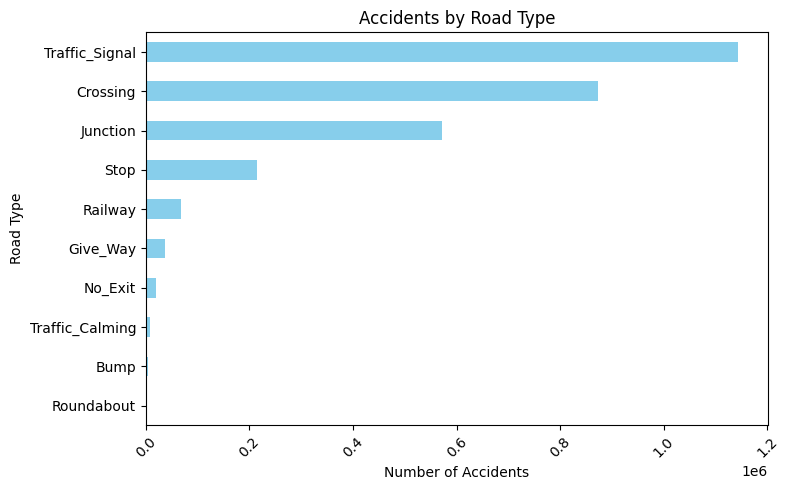

In [15]:
# Horizontal bar plot for accidents on different road types
road_columns = ['Roundabout', 'Junction', 'Railway', 'Bump', 'Traffic_Signal', 'Crossing', 'Give_Way', 'No_Exit', 'Stop', 'Traffic_Calming',]
for col in road_columns:
    if col in data.columns:
        data[col].fillna(0, inplace=True)  # Assume 0 if no accident occurred at this type of road feature
road_type_accidents = data[road_columns].sum()  # Sum accidents per road type (counting 1 for each accident)

# plot the data
plt.figure(figsize=(8, 5))
road_type_accidents.sort_values(ascending=True).plot(kind='barh', color='skyblue')
plt.title('Accidents by Road Type')
plt.xlabel('Number of Accidents')
plt.ylabel('Road Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Exploring Traffic Signal Presence and Its Impact on Accident Rates

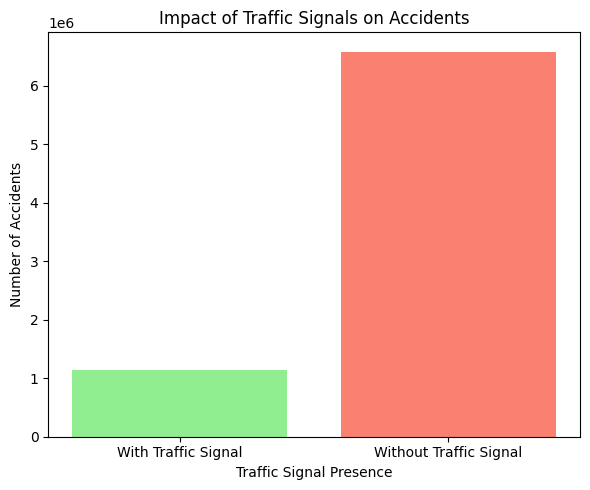

In [16]:
# Create bar chart for accidents based on the presence of traffic signals
data['Traffic_Signal'].fillna(0, inplace=True)
accidents_with_signal = data[data['Traffic_Signal'] == 1].shape[0]
accidents_without_signal = data[data['Traffic_Signal'] == 0].shape[0]
accident_counts = {
    'With Traffic Signal': accidents_with_signal,
    'Without Traffic Signal': accidents_without_signal
}

# plot the bar chart
plt.figure(figsize=(6, 5))
plt.bar(accident_counts.keys(), accident_counts.values(), color=['lightgreen', 'salmon'])
plt.title('Impact of Traffic Signals on Accidents')
plt.xlabel('Traffic Signal Presence')
plt.ylabel('Number of Accidents')
plt.tight_layout()
plt.show()

### Displaying Traffic Accidents by Time of Day and Number of Accidents

<Figure size 1000x500 with 0 Axes>

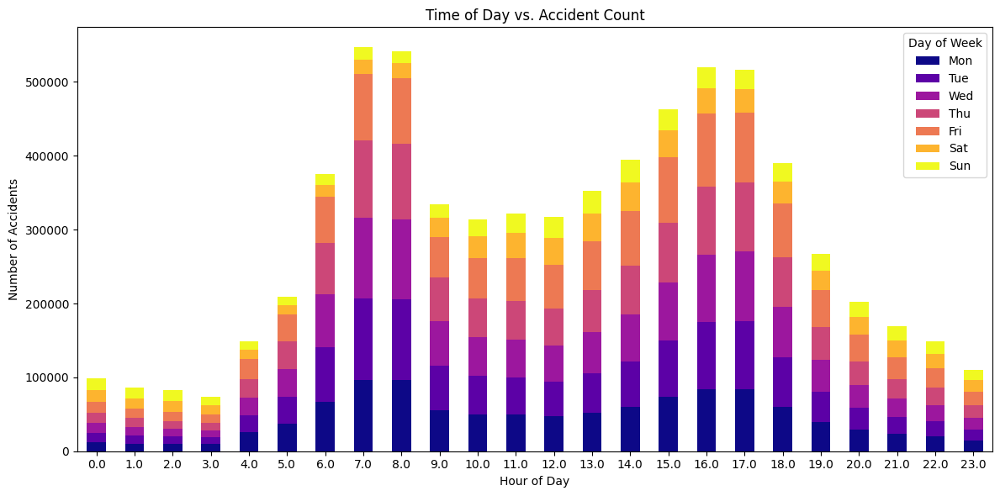

In [17]:
# Display the stacked plot for Day of Week and Hour to get accident count
data['Start_Time'] = pd.to_datetime(data['Start_Time'], errors='coerce')
data['Hour'] = data['Start_Time'].dt.hour
data['Day_of_Week'] = data['Start_Time'].dt.dayofweek  
accidents_by_time_of_day = data.groupby(['Day_of_Week', 'Hour']).size().unstack(fill_value=0)

# Plot the Stacked Bar 
plt.figure(figsize=(10, 5))
accidents_by_time_of_day.T.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='plasma')
plt.title('Time of Day vs. Accident Count')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=0)
plt.legend(title='Day of Week', labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.tight_layout()
plt.show()

### Analyzing Top Weather Conditions Contributing to Traffic Accidents

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


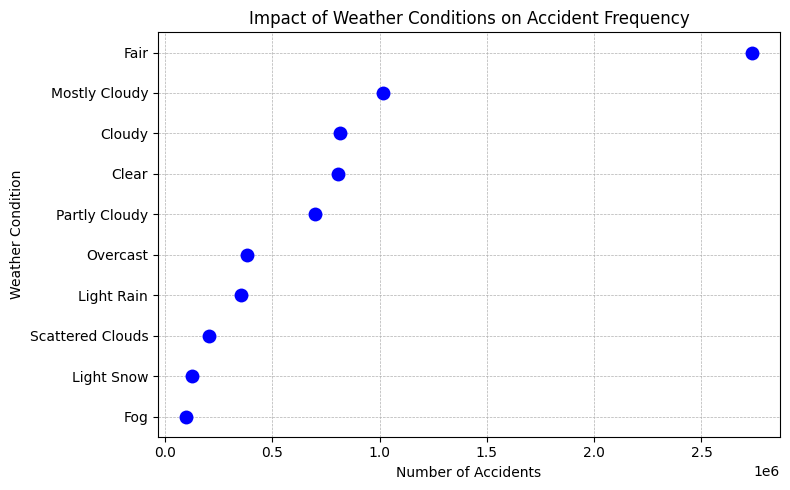

In [18]:
# Plotting a dot plot
weather_counts = data['Weather_Condition'].value_counts().head(10)
plt.figure(figsize=(8, 5))
sns.stripplot(
    x=weather_counts.values,
    y=weather_counts.index,
    size=10, 
    color='b',
    orient='h',  
)
plt.title('Impact of Weather Conditions on Accident Frequency')
plt.xlabel('Number of Accidents')
plt.ylabel('Weather Condition')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

### Demonstrating Monthly Variation in Traffic Accident Counts Over the Years

<Figure size 700x600 with 0 Axes>

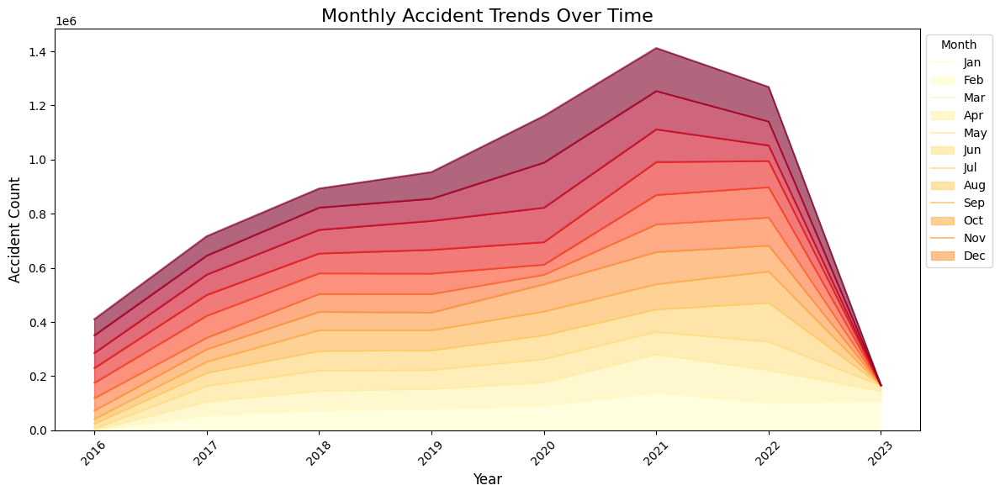

In [19]:
# Extracting the data by year and monthly accident count
data['Start_Time'] = pd.to_datetime(data['Start_Time'])
data['Year'] = data['Start_Time'].dt.year
data['Month'] = data['Start_Time'].dt.month
monthly_accidents = data.groupby(['Year', 'Month']).size().reset_index(name='Accident_Count')
monthly_trends = monthly_accidents.pivot_table(index='Year', columns='Month', values='Accident_Count', aggfunc='sum')

# Plot area chart
plt.figure(figsize=(7, 6))
monthly_trends.plot(kind='area', stacked=True, figsize=(12, 6), cmap='YlOrRd', alpha=0.6)
plt.title('Monthly Accident Trends Over Time', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Accident Count', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Month', bbox_to_anchor=(1, 1), loc='upper left', labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.tight_layout()
plt.show()

### Extracting Accidents Based on Nearby Different Amenities

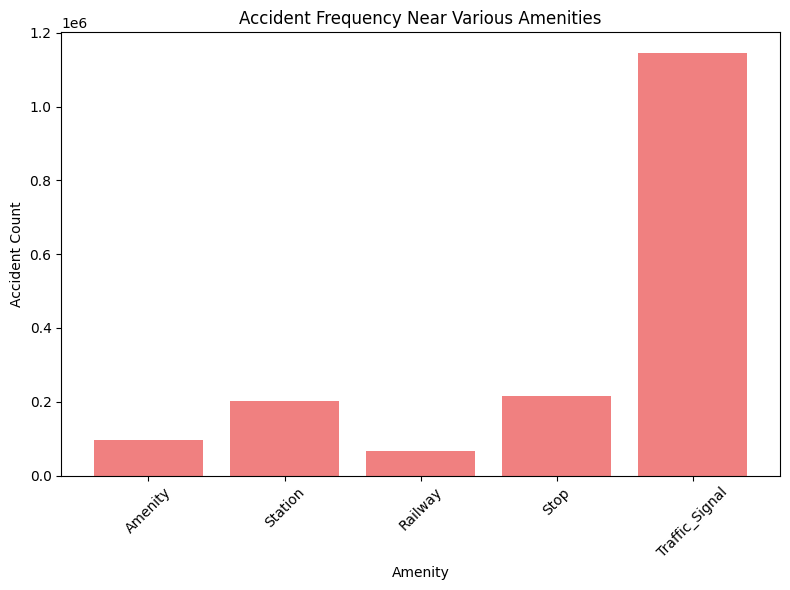

Total accidents near Amenity: 96334
Total accidents near Station: 201901
Total accidents near Railway: 66979
Total accidents near Stop: 214371
Total accidents near Traffic_Signal: 1143772


In [20]:
# Plotting Count accidents near each amenity
amenities = ['Amenity', 'Station', 'Railway', 'Stop', 'Traffic_Signal']
amenity_counts = {amenity: data[amenity].sum() for amenity in amenities}
amenity_counts_df = pd.DataFrame(list(amenity_counts.items()), columns=['Amenity', 'Accident Count'])

# Plott the data
plt.figure(figsize=(8, 6))
plt.bar(amenity_counts_df['Amenity'], amenity_counts_df['Accident Count'], color='lightcoral')
plt.title('Accident Frequency Near Various Amenities')
plt.xlabel('Amenity')
plt.ylabel('Accident Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# print the count of each outputs
for amenity in amenities:
    accident_count = amenity_counts[amenity]
    print(f"Total accidents near {amenity}: {accident_count}")

### Mapping Accident Locations by Latitude and Longitude

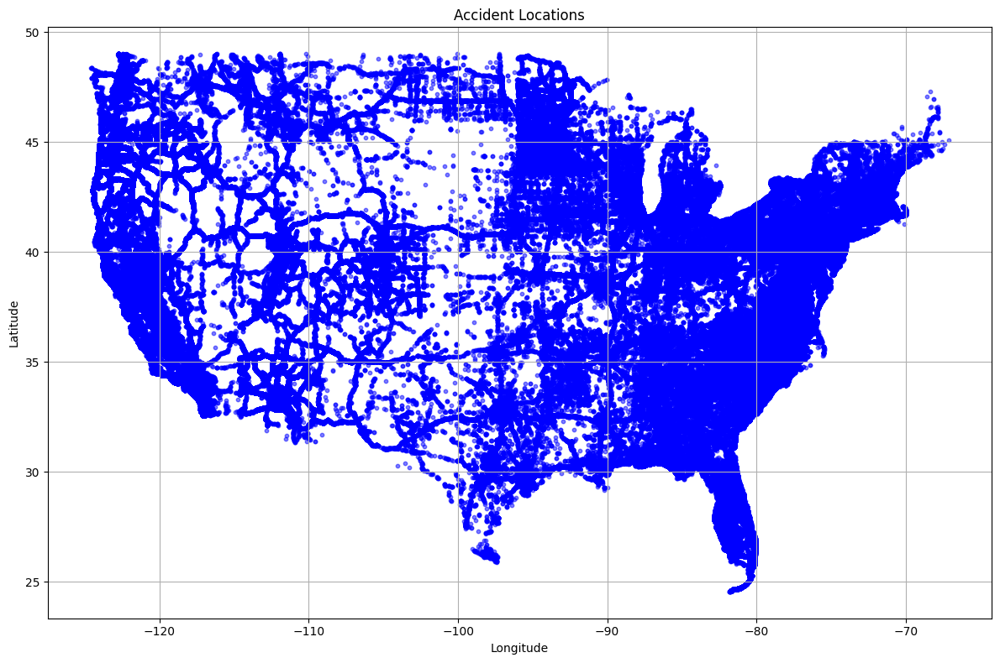

In [22]:
# Creating Scatter Plot for geographical data
plt.figure(figsize=(12, 8))
plt.scatter(data['Start_Lng'], data['Start_Lat'], alpha=0.5, s=10, c='blue')
plt.title('Accident Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.tight_layout()
plt.show()

### Visualizing Average Accident Severity by City Across the United States"

In [21]:
# Initialize folium map of United States markers with choropleth-style coloring based on severity
city_severity = data.groupby('City')['Severity'].mean().reset_index()
city_severity.columns = ['City', 'Avg_Severity']
city_coords = data.groupby('City')[['Start_Lat', 'Start_Lng']].mean().reset_index()
city_data = pd.merge(city_severity, city_coords, on='City')
m = folium.Map(location=[37.0902, -95.7129], zoom_start=4)
marker_cluster = MarkerCluster().add_to(m)

# Display the map
for _, row in city_data.iterrows():
    folium.CircleMarker(
        location=(row['Start_Lat'], row['Start_Lng']),
        radius=5,  
        fill=True,
        color=None,
        fill_color=plt.cm.YlOrRd(row['Avg_Severity'] / city_data['Avg_Severity'].max()),
        fill_opacity=0.7,
        popup=f"City: {row['City']}<br>Average Severity: {row['Avg_Severity']:.2f}"
    ).add_to(marker_cluster)
m.save('accident_severity_by_city.html')
m